In [1]:
import numpy as np
topics_train_ref = np.load('topic_distribution_results/topics_ref.npy')  # 17388 * 100
topics_train_tgt = np.load('topic_distribution_results/topics_tgts.npy') # 17388 * 10 * 100

N = 100   # topic distribution 


sample = 5000  # for train 
train_ref = topics_train_ref[:sample]  
train_tgt = topics_train_tgt[:sample]
               #  for test
test_ref = topics_train_ref[sample:2*sample]  
test_tgt = topics_train_tgt[sample:2*sample]


In [2]:
import csv
import torch
from torch import nn
import torch.nn.functional as F
from matplotlib.pyplot import figure, imshow, axis, title, scatter
from matplotlib.image import imread

# Weighted L1 
### a: anchor; p: positive; n: negative 
### loss = sum(abs(a-p)*W) - sum(abs(a-n)*W) 


In [3]:
'''4096'''
class WeightedL1(nn.Module):
    def __init__(self):
        super(WeightedL1, self).__init__() 
        self.weight = torch.ones(N, requires_grad=True)
        #self.loss_fn = nn.TripletMarginLoss(margin=1.0, p=2)
        self.optimizer = torch.optim.Adam([self.weight], lr=1e-4)
        self.loss= None
    
    def forward(self, x, y, z):
        x = self.weight * x
        y = self.weight * y
        z = self.weight * z
        return self.loss_fn(x, y, z)
    
    def loss_fn(self, x, y, z):
        margin = 1
        reg = 1e-6
        loss = sum(abs(x-y)) - sum(abs(x-z)) + margin
        return F.relu(loss)
    
    def train(self, x, y, z):
        self.loss = self.forward(x, y, z)
        self.optimizer.zero_grad()
        self.loss.backward()
        self.optimizer.step()     

In [4]:
with open('data/gt_train.csv', 'r') as f:
    reader = csv.reader(f)
    gt = [int(y) for x, y in list(reader)]

gt_train = gt[:sample]
gt_test = gt[sample:2*sample]

In [5]:
net = WeightedL1()
for epoch in range(100):
    for _ in range(sample):
        
        
        i = np.random.randint(sample)
        ind = [j for j in range(0,10) if j!=gt[i]][np.random.randint(9)]
        x = torch.from_numpy(train_ref[i]).float()
        y = torch.from_numpy(train_tgt[i][gt[i]]).float()
        z = torch.from_numpy(train_tgt[i][ind]).float()
        net.train(x,y,z)
    print(net.loss)
    print(net.weight.sum())

tensor(0.7797)
tensor(99.9232)
tensor(0.1977)
tensor(99.9150)
tensor(1.0543)
tensor(99.8208)
tensor(1.1170)
tensor(99.8130)
tensor(1.0978)
tensor(99.7458)
tensor(0.8361)
tensor(99.5941)
tensor(1.2869)
tensor(99.5066)
tensor(1.0023)
tensor(99.5023)
tensor(1.0770)
tensor(99.5319)
tensor(1.5009)
tensor(99.3058)
tensor(1.2748)
tensor(99.2965)
tensor(1.1391)
tensor(99.1643)
tensor(1.1048)
tensor(99.0861)
tensor(1.3348)
tensor(99.1968)
tensor(1.0876)
tensor(99.1600)
tensor(0.9044)
tensor(99.1988)
tensor(0.6168)
tensor(99.0353)
tensor(1.0597)
tensor(99.1040)
tensor(1.3730)
tensor(98.9689)
tensor(1.2428)
tensor(98.7814)
tensor(1.3238)
tensor(98.9724)
tensor(1.1493)
tensor(98.9089)
tensor(1.1412)
tensor(98.8451)
tensor(1.0154)
tensor(98.9782)
tensor(1.0330)
tensor(98.8190)
tensor(0.9419)
tensor(98.8019)
tensor(0.8103)
tensor(98.7275)
tensor(1.5308)
tensor(98.8302)
tensor(0.9724)
tensor(98.8866)
tensor(1.3135)
tensor(98.9104)
tensor(1.1358)
tensor(98.8442)
tensor(0.4751)
tensor(98.8863)
tensor(1

In [6]:
np.save('data/net_w.npy', net.weight.detach().numpy())

In [7]:
weight = np.load('data/net_w.npy')

In [8]:
dataset_size = sample

niv_pos_dis = np.zeros(dataset_size)
niv_neg_dis = np.zeros((dataset_size, 9))
mlr_pos_dis = np.zeros(dataset_size)
mlr_neg_dis = np.zeros((dataset_size, 9))

for i in range(dataset_size):

    niv_pos_dis[i] = sum(abs(test_ref[i] - test_tgt[i][gt_test[i]]))
    
    niv_neg_dis[i,:] = [sum(abs(test_ref[i] - test_tgt[i][j])) for j in range(0,10) if j!=gt_test[i]]
   
    mlr_pos_dis[i] = sum(weight * abs(test_ref[i] - test_tgt[i][gt_test[i]]))
    
    mlr_neg_dis[i,:] = [sum(weight*(abs(test_ref[i] - test_tgt[i][j]))) for j in range(0,10) if j!=gt_test[i]]

Accuracy:  0.0946


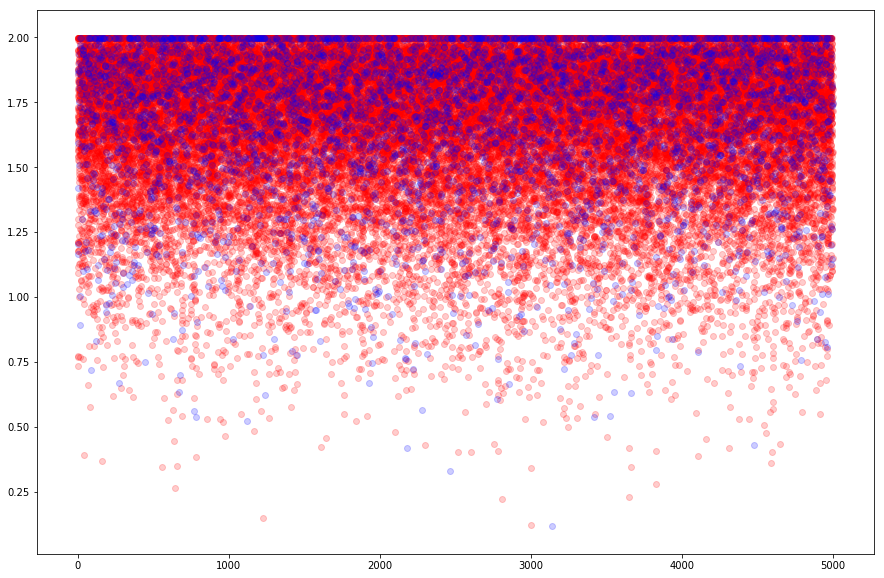

In [9]:
X = np.array([i for i in range(dataset_size)])

figure(figsize=(15,10))
for i in range(9):
    scatter(X, niv_neg_dis[:,i], c='r', alpha=0.2)
scatter(X, niv_pos_dis, c='b', alpha=0.2)

print("Accuracy: ", np.sum(niv_neg_dis.min(axis=1)>niv_pos_dis)/niv_pos_dis.shape[0])

Accuracy:  0.0968


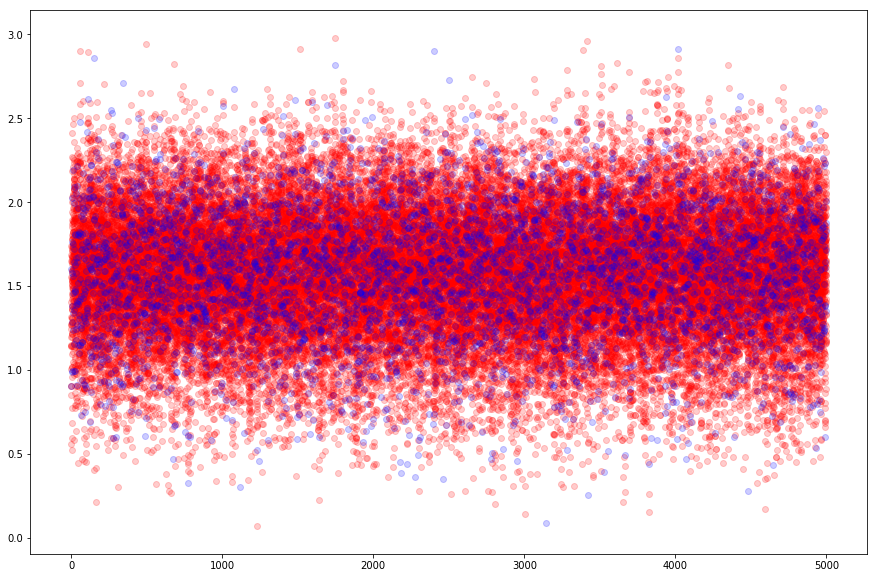

In [10]:
figure(figsize=(15,10))
for i in range(9):
    scatter(X, mlr_neg_dis[:,i], c='r', alpha=0.2)
scatter(X, mlr_pos_dis, c='b', alpha=0.2)

print("Accuracy: ", np.sum(mlr_neg_dis.min(axis=1)>mlr_pos_dis)/mlr_pos_dis.shape[0])

In [11]:
niv_ind3 = niv_neg_dis[:1000,:].argsort()[:,2]
niv_ind5 = niv_neg_dis[:1000,:].argsort()[:,4]

mlr_ind3 = mlr_neg_dis[:1000,:].argsort()[:,2]
mlr_ind5 = mlr_neg_dis[:1000,:].argsort()[:,4]

print('Naive MSE:')
print('Top 1: ', np.sum(niv_neg_dis[:1000,:].min(axis=1)>niv_pos_dis[:1000])/1000)
print('Top 3: ', np.sum(niv_neg_dis[range(1000),niv_ind3]>niv_pos_dis[:1000])/1000)
print('Top 5: ', np.sum(niv_neg_dis[range(1000),niv_ind5]>niv_pos_dis[:1000])/1000)

print('Learned MSE:')
print('Top 1: ', np.sum(mlr_neg_dis[:1000,:].min(axis=1)>mlr_pos_dis[:1000])/1000)
print('Top 3: ', np.sum(mlr_neg_dis[range(1000),mlr_ind3]>mlr_pos_dis[:1000])/1000)
print('Top 5: ', np.sum(mlr_neg_dis[range(1000),mlr_ind5]>mlr_pos_dis[:1000])/1000)

Naive MSE:
Top 1:  0.111
Top 3:  0.286
Top 5:  0.47
Learned MSE:
Top 1:  0.109
Top 3:  0.295
Top 5:  0.486


In [12]:
def plot_img(idx, gt, seq):
    path = 'data/task_train/' + '0' * (9 - len(str(idx))) + str(idx) + '/'
    num_of_imgs = 11
    
    fig = figure(figsize=(16,16))
    
    a=fig.add_subplot(1,num_of_imgs,1)
    image = imread(path + 'reference.jpg')
    imshow(image)
    title('Reference')
    axis('off')

    for i in range(len(seq)):
        a=fig.add_subplot(1,num_of_imgs,i+2)
        image = imread(path + 'choice_' + str(seq[i]) + '.jpg')
        imshow(image)
        if seq[i] == gt:
            title('Target')
        axis('off')

In [13]:
niv_dis_rank = np.zeros((dataset_size, 10), dtype=int)
mlr_dis_rank = np.zeros((dataset_size, 10), dtype=int)

for i in range(dataset_size):
    niv_dis_rank[i,:] = np.array([sum(abs(test_ref[i] - test_tgt[i][j])) for j in range(10)]).argsort()
   
    mlr_dis_rank[i,:] = np.array([sum(weight*(abs(test_ref[i] - test_tgt[i][j]))) for j in range(10)]).argsort()

print(niv_dis_rank[1,:])
print(mlr_dis_rank[1,:])

[5 3 2 6 9 1 0 8 4 7]
[4 1 3 2 9 5 6 8 7 0]


/Users/mac/anaconda3/lib/python3.6/site-packages/matplotlib/pyplot.py:537: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


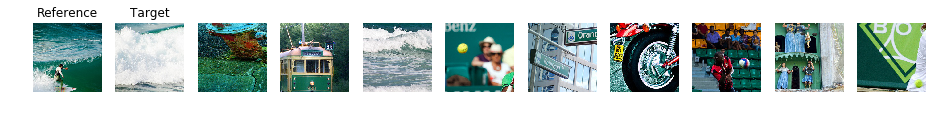

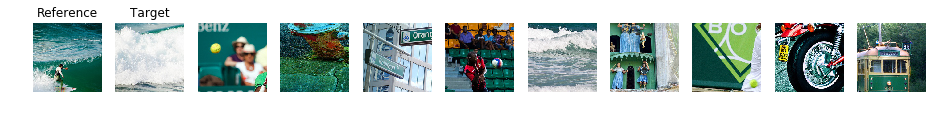

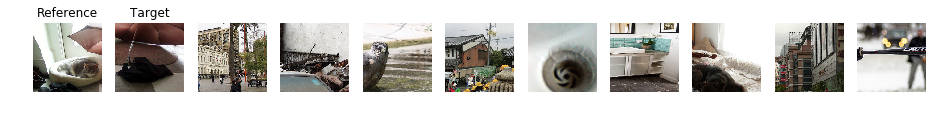

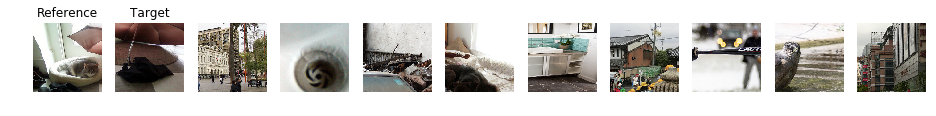

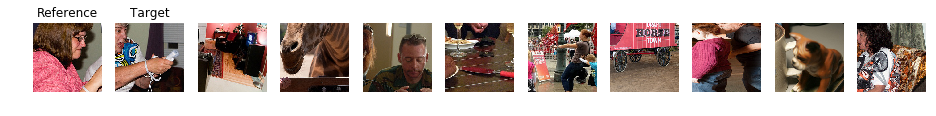

...

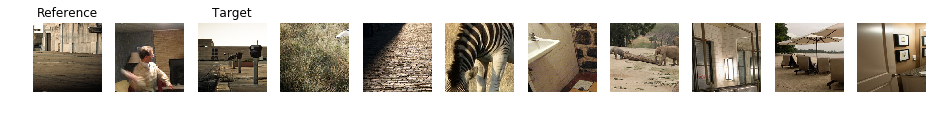

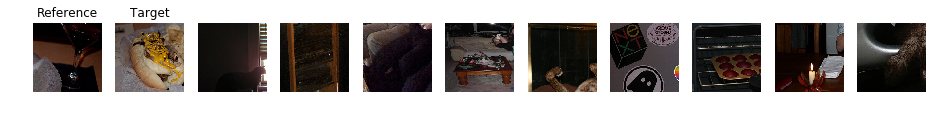

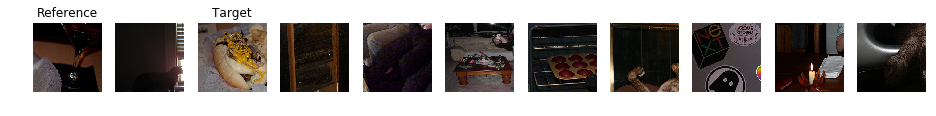

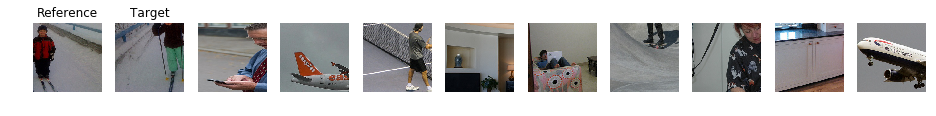

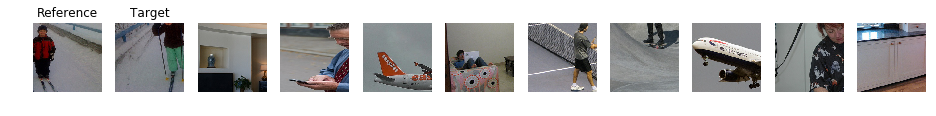

In [14]:
k = 0
while(k<20):
    i = np.random.randint(dataset_size)
    if gt_test[i]==mlr_dis_rank[i,0]:
        plot_img(i+sample, gt_test[i], mlr_dis_rank[i,:])
        plot_img(i+sample, gt_test[i], niv_dis_rank[i,:])
        k += 1
        
        

/Users/mac/anaconda3/lib/python3.6/site-packages/matplotlib/pyplot.py:537: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


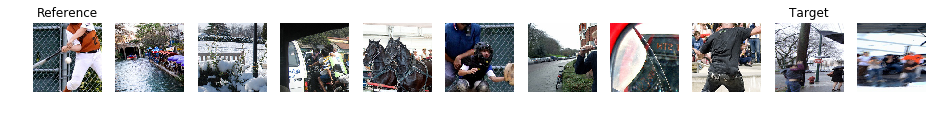

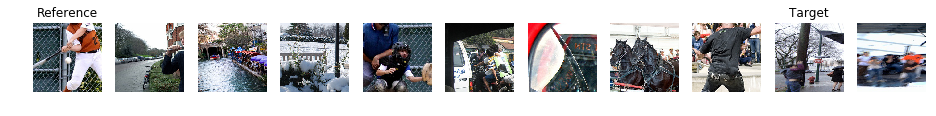

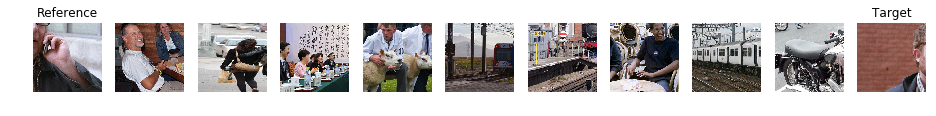

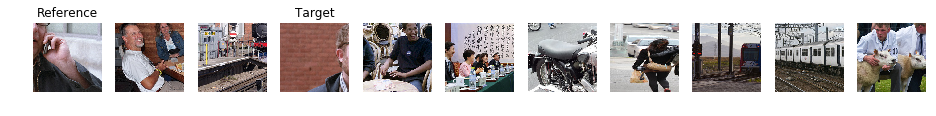

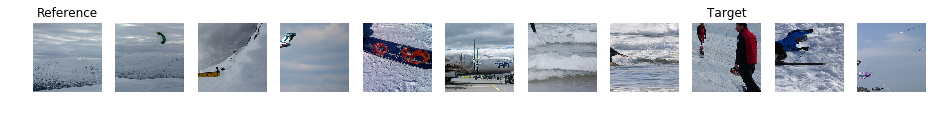

...

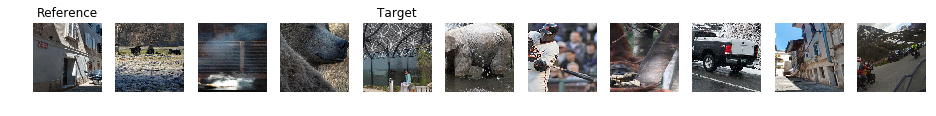

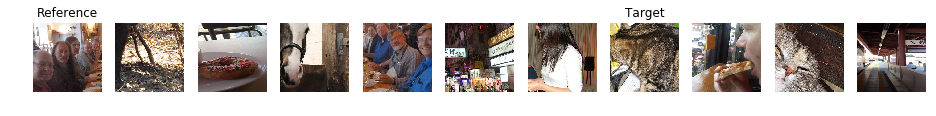

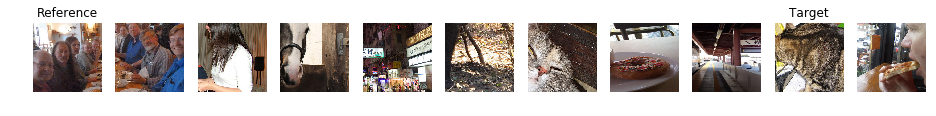

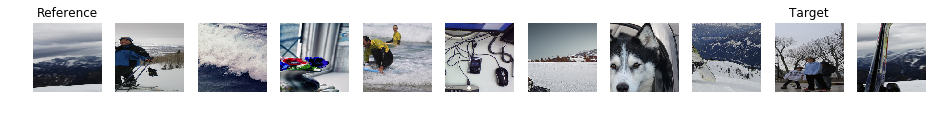

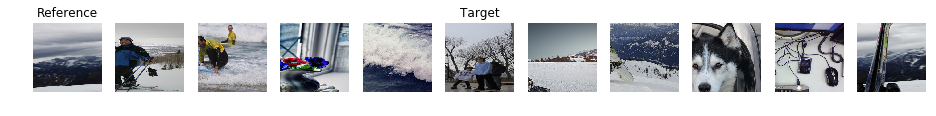

In [15]:
k = 0
while(k<20):
    i = np.random.randint(dataset_size)
    if (gt[i])!=mlr_dis_rank[i,0]:
        plot_img(i+sample, gt[i], mlr_dis_rank[i,:])
        plot_img(i+sample, gt[i], niv_dis_rank[i,:])
        k += 1